<a href="https://colab.research.google.com/github/NikolaKujoh/chess-game-to-fen/blob/main/YOLO_chess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Chesscog
!cp /content/drive/MyDrive/chess-project/chesscog.zip /content/
!unzip -q /content/chesscog.zip -d /content/chesscog

# ChessReD
!cp -r /content/drive/MyDrive/chess-project/chessred /content/
!cp /content/drive/MyDrive/chess-project/annotations.json /content/

# Roboflow
!cp /content/drive/MyDrive/chess-project/Chess_Pieces.v23-raw.yolov8.zip /content/
!unzip -q /content/Chess_Pieces.v23-raw.yolov8.zip -d /content/Roboflow

In [ ]:
!cp /content/drive/MyDrive/chess-project/convert_to_yolo.py /content/
!cp /content/drive/MyDrive/chess-project/merge_yolo_datasets.py /content/
!cp /content/drive/MyDrive/chess-project/parsed_dataset.json /content/

In [ ]:
!python convert_to_yolo.py --source chesscog \
    --records /content/parsed_dataset.json \
    --dataroot /content/chesscog/dataset \
    --out /content/yolo_data/chesscog


Gotovo. Izvor: chesscog
Po splitovima: {'train': 2932, 'val': 977, 'test': 979}
Izlaz: /content/yolo_data/chesscog
data.yaml sačuvan u /content/yolo_data/chesscog/data.yaml


In [ ]:
%%writefile resplit_chessred_by_game.py
"""
Deli ChessReD dataset na train/val/test PO PARTIJI (game_id), ne po
pojedinačnoj slici, i direktno generiše YOLO detekcione labele za figure.

ZAŠTO: ChessReD ima samo 20 partija sa ~104 slike po partiji (uzastopni
potezi iste partije, isti sto, ista kamera). Split po pojedinačnoj slici
curi podatke - model vidi "brata" test slike (istu scenu, par poteza
ranije) tokom treninga, što daje lažno visoke rezultate. Ispravan split
mora da drži SVE slike jedne partije u istom splitu.

Podržava i K-fold (--n-folds/--fold) da bi se izmerio RASPON rezultata
preko različitih test partija, što je važno kad je broj partija mali
(N=20) - jedan nasumičan split može "pogoditi" lakše ili teže partije.

Izlazna struktura (kompatibilna sa merge_yolo_datasets.py):
    <out>/images/train/*.jpg (ili .png)
    <out>/images/val/*.jpg
    <out>/images/test/*.jpg
    <out>/labels/train/*.txt
    <out>/labels/val/*.txt
    <out>/labels/test/*.txt

Korišćenje (jedan split, 70/15/15 po broju partija):
    python resplit_chessred_by_game.py \
        --annotations /content/annotations.json \
        --dataroot /content/chessred \
        --out /content/yolo_data/chessred_v2 \
        --seed 42

Korišćenje (K-fold, za merenje raspona rezultata - ponoviti za fold 0..4):
    python resplit_chessred_by_game.py \
        --annotations /content/annotations.json \
        --dataroot /content/chessred \
        --out /content/yolo_data/chessred_fold0 \
        --n-folds 5 --fold 0 --seed 42
"""

import argparse
import json
import random
import shutil
from pathlib import Path

# ChessReD category_id -> (class_index, FEN slovo)
# category_id se poklapa 1:1 sa redosledom klasa u kombinovanom data.yaml:
# ['white-pawn','white-rook','white-knight','white-bishop','white-queen','white-king',
#  'black-pawn','black-rook','black-knight','black-bishop','black-queen','black-king']
CAT_TO_CLASS_IDX = {i: i for i in range(12)}  # category_id 0-11 -> class index 0-11 (1:1)
OCCLUDED_CAT = 12  # kategorija za figure van vidnog polja - preskače se


def get_bbox_xywh(piece, img_w, img_h):
    """Vraća (x, y, w, h) u apsolutnim pikselima iz piece anotacije.
    Proba nekoliko mogućih ključeva jer format nije bio potvrđen unapred."""
    if "bbox" in piece:
        x, y, w, h = piece["bbox"]
        return float(x), float(y), float(w), float(h)
    if "box" in piece:
        x, y, w, h = piece["box"]
        return float(x), float(y), float(w), float(h)
    raise KeyError(
        f"Ne mogu da nađem bbox u piece zapisu. Dostupni ključevi: {list(piece.keys())}. "
        f"Prilagodi get_bbox_xywh() ovoj strukturi."
    )


def split_games_single(game_ids, ratio_str, seed):
    games = sorted(game_ids)
    random.Random(seed).shuffle(games)

    parts = [float(x) for x in ratio_str.split("/")]
    total = sum(parts)
    n = len(games)
    n_train = round(n * parts[0] / total)
    n_val = round(n * parts[1] / total)
    # ostatak ide u test, da se svih N partija sigurno rasporedi
    n_test = n - n_train - n_val

    train_games = set(games[:n_train])
    val_games = set(games[n_train:n_train + n_val])
    test_games = set(games[n_train + n_val:])

    print(f"Split po partijama (seed={seed}): "
          f"train={len(train_games)} val={len(val_games)} test={len(test_games)}")
    print(f"  train partije: {sorted(train_games)}")
    print(f"  val partije  : {sorted(val_games)}")
    print(f"  test partije : {sorted(test_games)}")
    return train_games, val_games, test_games


def split_games_kfold(game_ids, n_folds, fold, seed):
    games = sorted(game_ids)
    random.Random(seed).shuffle(games)
    n = len(games)

    # deli na n_folds skoro jednakih delova
    folds = [[] for _ in range(n_folds)]
    for i, g in enumerate(games):
        folds[i % n_folds].append(g)

    test_games = set(folds[fold])
    val_fold_idx = (fold + 1) % n_folds
    val_games = set(folds[val_fold_idx])
    train_games = set(games) - test_games - val_games

    print(f"K-fold split (n_folds={n_folds}, fold={fold}, seed={seed}): "
          f"train={len(train_games)} val={len(val_games)} test={len(test_games)}")
    print(f"  test partije (fold {fold}): {sorted(test_games)}")
    print(f"  val partije (fold {val_fold_idx}): {sorted(val_games)}")
    return train_games, val_games, test_games


def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--annotations", required=True)
    ap.add_argument("--dataroot", required=True,
                    help="folder sa slikama (sadrži <game_id>/<fajl> podfoldere)")
    ap.add_argument("--out", required=True)
    ap.add_argument("--ratio", default="70/15/15",
                    help="train/val/test odnos PO BROJU PARTIJA (koristi se ako --n-folds nije zadat)")
    ap.add_argument("--n-folds", type=int, default=None,
                    help="ako je zadato, radi K-fold split po partijama umesto --ratio")
    ap.add_argument("--fold", type=int, default=0,
                    help="koji fold materijalizovati (0-indeksirano), samo uz --n-folds")
    ap.add_argument("--seed", type=int, default=42)
    ap.add_argument("--link", action="store_true",
                    help="koristi symlink umesto kopiranja slika (brže, štedi disk)")
    args = ap.parse_args()

    dataroot = Path(args.dataroot)
    out_root = Path(args.out)

    with open(args.annotations) as f:
        raw = json.load(f)

    images = {im["id"]: im for im in raw["images"]}
    corners = {c["image_id"] for c in raw["annotations"]["corners"]}  # samo id-jevi

    pieces_by_img = {}
    for p in raw["annotations"]["pieces"]:
        pieces_by_img.setdefault(p["image_id"], []).append(p)

    # samo potpuno anotirane slike (imaju i uglove) - isti skup kao ranije (2078)
    annotated_ids = sorted(corners)
    game_ids = set(images[i]["game_id"] for i in annotated_ids)
    print(f"Ukupno anotiranih slika: {len(annotated_ids)}, partija: {len(game_ids)}")

    if args.n_folds:
        train_games, val_games, test_games = split_games_kfold(
            game_ids, args.n_folds, args.fold, args.seed)
    else:
        train_games, val_games, test_games = split_games_single(
            game_ids, args.ratio, args.seed)

    game_to_split = {}
    for g in train_games:
        game_to_split[g] = "train"
    for g in val_games:
        game_to_split[g] = "val"
    for g in test_games:
        game_to_split[g] = "test"

    for split in ("train", "val", "test"):
        (out_root / "images" / split).mkdir(parents=True, exist_ok=True)
        (out_root / "labels" / split).mkdir(parents=True, exist_ok=True)

    counts = {"train": 0, "val": 0, "test": 0}
    skipped_no_pieces = 0
    skipped_no_image = 0

    for img_id in annotated_ids:
        meta = images[img_id]
        split = game_to_split[meta["game_id"]]

        img_w, img_h = meta["width"], meta["height"]
        rel_path = meta["path"].replace("\\", "/")
        if rel_path.startswith("images/"):
            rel_path = rel_path[len("images/"):]
        src_img = dataroot / rel_path

        if not src_img.exists():
            skipped_no_image += 1
            continue

        pieces = pieces_by_img.get(img_id, [])
        if not pieces:
            skipped_no_pieces += 1
            # ipak nastavljamo - prazna tabla je validan slučaj, samo bez YOLO labela

        # jedinstveno ime fajla (game_id + image_id), da izbegnemo kolizije
        stem = f"g{meta['game_id']}_{img_id}_{Path(meta['file_name']).stem}"
        ext = Path(meta["file_name"]).suffix
        dst_img = out_root / "images" / split / f"{stem}{ext}"
        dst_lbl = out_root / "labels" / split / f"{stem}.txt"

        if args.link:
            if not dst_img.exists():
                dst_img.symlink_to(src_img.resolve())
        else:
            shutil.copy2(src_img, dst_img)

        lines = []
        for p in pieces:
            cat = p["category_id"]
            if cat == OCCLUDED_CAT:
                continue
            cls_idx = CAT_TO_CLASS_IDX[cat]
            x, y, w, h = get_bbox_xywh(p, img_w, img_h)

            cx = (x + w / 2) / img_w
            cy = (y + h / 2) / img_h
            nw = w / img_w
            nh = h / img_h

            cx, cy = min(max(cx, 0.0), 1.0), min(max(cy, 0.0), 1.0)
            nw, nh = min(max(nw, 0.0), 1.0), min(max(nh, 0.0), 1.0)

            lines.append(f"{cls_idx} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}")

        dst_lbl.write_text("\n".join(lines))
        counts[split] += 1

    print(f"\nGotovo. Slika po splitu: {counts}")
    print(f"Preskočeno (nema fajl slike): {skipped_no_image}")
    print(f"Slika bez figura (prazna tabla, i dalje uključene): {skipped_no_pieces}")
    print(f"Izlaz: {out_root.resolve()}")


if __name__ == "__main__":
    main()

Overwriting resplit_chessred_by_game.py


In [ ]:
import json
with open('/content/annotations.json') as f:
    raw = json.load(f)
print(raw["annotations"]["pieces"][0])

{'image_id': 0, 'category_id': 7, 'chessboard_position': 'a8', 'id': 0, 'bbox': [510.34, 963.65, 155.75, 186.14]}


In [ ]:
!python resplit_chessred_by_game.py \
    --annotations /content/annotations.json \
    --dataroot /content/chessred \
    --out /content/yolo_data/chessred_v2 \
    --n-folds 5 --fold 0 --seed 42

Ukupno anotiranih slika: 2078, partija: 20
K-fold split (n_folds=5, fold=0, seed=42): train=12 val=4 test=4
  test partije (fold 0): [72, 83, 87, 99]
  val partije (fold 1): [33, 41, 56, 78]

Gotovo. Slika po splitu: {'train': 1265, 'val': 412, 'test': 401}
Preskočeno (nema fajl slike): 0
Slika bez figura (prazna tabla, i dalje uključene): 0
Izlaz: /content/yolo_data/chessred_v2


In [ ]:
!python merge_yolo_datasets.py \
    --chesscog /content/yolo_data/chesscog \
    --chessred /content/yolo_data/chessred_v2 \
    --roboflow /content/Roboflow \
    --out /content/yolo_data/combined_v2

Spajam chesscog...
  [chesscog] train: 2932 slika
  [chesscog] val: 977 slika
  [chesscog] test: 979 slika
Spajam chessred...
  [chessred] train: 1265 slika
  [chessred] val: 412 slika
  [chessred] test: 401 slika
Spajam roboflow...
  [roboflow] train: 202 slika
  [roboflow] val: 58 slika
  [roboflow] test: 29 slika

Gotovo. Ukupno po splitovima: {'train': 4399, 'val': 1447, 'test': 1409}
Izlaz: /content/yolo_data/combined_v2
data.yaml: /content/yolo_data/combined_v2/data.yaml


In [ ]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
results = model.train(
    data='/content/yolo_data/combined_v2/data.yaml',
    epochs=50, imgsz=640, batch=16,
    name='chess_pieces_yolo_v2'
)

Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_data/combined_v2/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=chess_pieces_yolo_v2-2,

In [ ]:
import shutil
import os

# napravi folder na Drive-u ako ne postoji
os.makedirs('/content/drive/MyDrive/chess-project/models', exist_ok=True)

# kopiraj best.pt (i last.pt za svaki slučaj) na Drive
shutil.copy(
    '/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt',
    '/content/drive/MyDrive/chess-project/models/chess_pieces_yolo_v2_best.pt'
)
shutil.copy(
    '/content/runs/detect/chess_pieces_yolo_v2/weights/last.pt',
    '/content/drive/MyDrive/chess-project/models/chess_pieces_yolo_v2_last.pt'
)
print("Sačuvano na Drive.")

Sačuvano na Drive.


In [ ]:
%%writefile assign_to_board.py
"""
Dodela YOLO detekcija poljima table preko homografije primenjene SAMO na
tačke (baza bbox-a), bez warp-ovanja same slike. YOLO radi isključivo na
sirovoj fotografiji.

Za svaku detekciju uzima se tačka na sredini donje ivice bbox-a (baza
figure - stopa, ne vrh, jer je stopa uvek na ravni table bez obzira na
visinu figure). Ta tačka se transformiše preko homografije (računate iz
4 ugla table) u ravan idealne table dimenzija size x size, pa se mapira
u jedno od 64 polja. Ako više detekcija upadne u isto polje, zadržava se
ona sa većim confidence-om. Detekcije čija baza upadne van table se
odbacuju.

Dva režima za uglove table (--corner-mode):
  true    - anotirani (ground-truth) uglovi; gornja granica performansi
            YOLO dela sistema, izolovana od greške corner detektora
  heatmap - uglovi predviđeni heatmap CNN modelom; pravi end-to-end
            rezultat celog sistema

Za ChessReD je KRITIČNO filtrirati na samo held-out test split (preko
--test-ids-dir), jer je YOLO treniran i na delu ChessReD slika - bez
filtriranja bi merenje bilo kontaminirano (data leakage).

Korišćenje:
    # anotirani uglovi (gornja granica)
    python assign_to_board.py --source chessred --dataroot /content/chessred \
        --annotations /content/annotations.json \
        --test-ids-dir /content/yolo_data/combined_v2/images/test \
        --weights best.pt --corner-mode true

    # predvidjeni uglovi (end-to-end)
    python assign_to_board.py --source chessred --dataroot /content/chessred \
        --annotations /content/annotations.json \
        --test-ids-dir /content/yolo_data/combined_v2/images/test \
        --weights best.pt --corner-mode heatmap \
        --corner-weights /content/models/corner_heatmap_chessred.pth
"""

import argparse
import json
import os
import re
from pathlib import Path

import cv2
import numpy as np
import torch
import torch.nn as nn
from torchvision import transforms, models
from torchvision.models import ResNet18_Weights
from PIL import Image
from ultralytics import YOLO

Image.MAX_IMAGE_PIXELS = None

FEN_TO_NAME = {
    "P": "white-pawn", "R": "white-rook", "N": "white-knight",
    "B": "white-bishop", "Q": "white-queen", "K": "white-king",
    "p": "black-pawn", "r": "black-rook", "n": "black-knight",
    "b": "black-bishop", "q": "black-queen", "k": "black-king",
}
NAME_TO_FEN = {v: k for k, v in FEN_TO_NAME.items()}

CAT_TO_FEN = {
    0: "P", 1: "R", 2: "N", 3: "B", 4: "Q", 5: "K",
    6: "p", 7: "r", 8: "n", 9: "b", 10: "q", 11: "k",
}
ROWS = "87654321"
COLS = "abcdefgh"

N_CORNERS = 4
IMNET = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])


# ------------------------------------------------------- heatmap model

class HeatmapNet(nn.Module):
    """Ista arhitektura kao u corner_heatmap.py / train_corner_chessred.py."""

    def __init__(self, n_deconv=4):
        super().__init__()
        backbone = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        self.encoder = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool,
            backbone.layer1, backbone.layer2, backbone.layer3, backbone.layer4,
        )
        layers = []
        in_ch = 512
        for out_ch in [256, 128, 64, 32][:n_deconv]:
            layers += [
                nn.ConvTranspose2d(in_ch, out_ch, 4, stride=2, padding=1),
                nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            ]
            in_ch = out_ch
        self.decoder = nn.Sequential(*layers)
        self.head = nn.Conv2d(in_ch, N_CORNERS, 1)

    def forward(self, x):
        return self.head(self.decoder(self.encoder(x)))


class CornerPredictor:
    """Predviđa 4 ugla table u koordinatama ORIGINALNE slike."""

    def __init__(self, weights_path, device, img_size=256, n_deconv=4):
        self.device = device
        self.img_size = img_size
        self.model = HeatmapNet(n_deconv=n_deconv).to(device)
        self.model.load_state_dict(torch.load(weights_path, map_location=device))
        self.model.eval()
        self.tf = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(*IMNET),
        ])
        print(f"Corner model učitan: {weights_path} (img_size={img_size})")

    @torch.inference_mode()
    def predict(self, img_bgr):
        H_img, W_img = img_bgr.shape[:2]
        pil = Image.fromarray(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
        x = self.tf(pil).unsqueeze(0).to(self.device)
        hm = self.model(x)[0].cpu().numpy()   # (4, h, w)

        _, h, w = hm.shape
        pts = np.zeros((4, 2), dtype=np.float32)
        for k in range(4):
            m = hm[k]
            py, px = np.unravel_index(np.argmax(m), m.shape)
            dx = dy = 0.0
            if 0 < px < w - 1:
                dx = 0.25 * np.sign(m[py, px + 1] - m[py, px - 1])
            if 0 < py < h - 1:
                dy = 0.25 * np.sign(m[py + 1, px] - m[py - 1, px])
            pts[k, 0] = (px + dx) * W_img / w
            pts[k, 1] = (py + dy) * H_img / h
        return pts


# ------------------------------------------------------------- podaci

def named_to_order(corner_dict):
    """ChessReD imenovani uglovi -> [a1,a8,h8,h1] redosled."""
    return np.array([
        corner_dict["bottom_left"],
        corner_dict["top_left"],
        corner_dict["top_right"],
        corner_dict["bottom_right"],
    ], dtype=np.float32)


def build_chessred_records(annotations_path: Path, test_ids=None):
    with open(annotations_path) as f:
        raw = json.load(f)

    images = {im["id"]: im for im in raw["images"]}
    corners = {c["image_id"]: c["corners"] for c in raw["annotations"]["corners"]}

    pieces_by_img = {}
    for p in raw["annotations"]["pieces"]:
        pieces_by_img.setdefault(p["image_id"], []).append(p)

    records = []
    for img_id, corner_dict in corners.items():
        if test_ids is not None and img_id not in test_ids:
            continue

        meta = images[img_id]
        path = meta["path"].replace("\\", "/")
        if path.startswith("images/"):
            path = path[len("images/"):]

        board = [["." for _ in range(8)] for _ in range(8)]
        for p in pieces_by_img.get(img_id, []):
            cat = p["category_id"]
            if cat == 12:
                continue
            pos = p["chessboard_position"]
            r = ROWS.index(pos[1]); c = COLS.index(pos[0])
            board[r][c] = CAT_TO_FEN[cat]

        records.append({
            "id": img_id,
            "path": path,
            "corners": named_to_order(corner_dict),
            "board": board,
        })
    return records


def load_test_ids_from_dir(test_dir: str):
    """Izvlači ChessReD image_id iz imena fajlova u YOLO test folderu.
    Format: chessred_g<game_id>_<image_id>_<original_stem>.ext"""
    test_ids = set()
    skipped = 0
    pattern = re.compile(r'^chessred_g\d+_(\d+)_')
    for fname in os.listdir(test_dir):
        m = pattern.match(fname)
        if m:
            test_ids.add(int(m.group(1)))
        else:
            skipped += 1
    print(f"Učitano {len(test_ids)} chessred test ID-jeva iz {test_dir} "
          f"(preskočeno {skipped} fajlova iz drugih izvora)")
    return test_ids


def load_chesscog_records(records_path: Path, split="test"):
    with open(records_path) as f:
        records = json.load(f)
    out = []
    for r in records:
        if r.get("split") != split:
            continue
        out.append({
            "id": r["id"],
            "path": r["path"].replace("\\", "/"),
            "corners": np.array(r["corners"], dtype=np.float32),
            "board": r["board"],
        })
    return out


# ------------------------------------------------------------- dodela

def assign_detections_to_board(boxes, classes, confs, names, H, size):
    cell = size / 8
    board = [["." for _ in range(8)] for _ in range(8)]
    best_conf = [[-1.0 for _ in range(8)] for _ in range(8)]

    if len(boxes) == 0:
        return board, 0

    base_pts = np.zeros((len(boxes), 1, 2), dtype=np.float32)
    for i, (x1, y1, x2, y2) in enumerate(boxes):
        base_pts[i, 0] = [(x1 + x2) / 2.0, y2]

    transformed = cv2.perspectiveTransform(base_pts, H)[:, 0, :]

    outside = 0
    for i, (tx, ty) in enumerate(transformed):
        col = int(tx // cell)
        row = int(ty // cell)
        if not (0 <= col < 8 and 0 <= row < 8):
            outside += 1
            continue
        if confs[i] > best_conf[row][col]:
            best_conf[row][col] = confs[i]
            board[row][col] = NAME_TO_FEN.get(names[int(classes[i])], ".")

    return board, outside


def board_correct_count(pred, true):
    return sum(1 for r in range(8) for c in range(8) if pred[r][c] == true[r][c])


def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--source", choices=["chesscog", "chessred"], required=True)
    ap.add_argument("--dataroot", required=True)
    ap.add_argument("--records", default="parsed_dataset.json", help="samo za chesscog")
    ap.add_argument("--split", default="test", help="samo za chesscog")
    ap.add_argument("--weights", required=True, help="YOLO težine za figure")
    ap.add_argument("--annotations", default=None, help="annotations.json (chessred)")
    ap.add_argument("--test-ids-dir", default=None,
                    help="folder sa YOLO test slikama za chessred (izbegava leakage)")
    ap.add_argument("--corner-mode", choices=["true", "heatmap"], default="true",
                    help="true = anotirani uglovi, heatmap = predvidjeni")
    ap.add_argument("--corner-weights", default=None,
                    help="putanja do heatmap modela (obavezno uz --corner-mode heatmap)")
    ap.add_argument("--corner-img-size", type=int, default=256)
    ap.add_argument("--size", type=int, default=800)
    ap.add_argument("--conf", type=float, default=0.25)
    ap.add_argument("--limit", type=int, default=None)
    args = ap.parse_args()

    if args.corner_mode == "heatmap" and not args.corner_weights:
        ap.error("--corner-mode heatmap zahteva --corner-weights")

    device = "cuda" if torch.cuda.is_available() else "cpu"
    dataroot = Path(args.dataroot)
    model = YOLO(args.weights)
    names = model.names

    corner_predictor = None
    if args.corner_mode == "heatmap":
        corner_predictor = CornerPredictor(args.corner_weights, device,
                                           img_size=args.corner_img_size)

    if args.source == "chesscog":
        records = load_chesscog_records(Path(args.records), args.split)
    else:
        ann_path = Path(args.annotations) if args.annotations else dataroot / "annotations.json"
        test_ids = None
        if args.test_ids_dir:
            test_ids = load_test_ids_from_dir(args.test_ids_dir)
        else:
            print("  [UPOZORENJE] --test-ids-dir nije zadat - moguće curenje podataka.")
        records = build_chessred_records(ann_path, test_ids=test_ids)

    print(f"{args.source}: {len(records)} slika za evaluaciju "
          f"(uglovi: {args.corner_mode})")
    if args.limit:
        records = records[:args.limit]
        print(f"Ograničeno na {len(records)}")

    dst = np.array([
        [0, args.size], [0, 0], [args.size, 0], [args.size, args.size],
    ], dtype=np.float32)

    sq_correct = sq_total = 0
    board_correct = 0
    missing = n_eval = 0
    corner_err_sum = corner_err_n = 0.0
    outside_total = 0

    for n, rec in enumerate(records):
        img = cv2.imread(str(dataroot / rec["path"]))
        if img is None:
            missing += 1
            continue

        true_corners = np.array(rec["corners"], dtype=np.float32)
        if corner_predictor is not None:
            src_corners = corner_predictor.predict(img)
            d = np.sqrt(((src_corners - true_corners) ** 2).sum(axis=1))
            corner_err_sum += d.sum()
            corner_err_n += d.size
        else:
            src_corners = true_corners

        H = cv2.getPerspectiveTransform(src_corners, dst)

        result = model.predict(img, conf=args.conf, verbose=False)[0]
        boxes = result.boxes.xyxy.cpu().numpy()
        classes = result.boxes.cls.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()

        pred_board, outside = assign_detections_to_board(
            boxes, classes, confs, names, H, args.size)
        outside_total += outside

        c = board_correct_count(pred_board, rec["board"])
        sq_correct += c
        sq_total += 64
        n_eval += 1
        if c == 64:
            board_correct += 1

        if (n + 1) % 100 == 0:
            print(f"  {n+1}/{len(records)} ... running per-square "
                  f"{sq_correct/sq_total*100:.2f}%")

    mode_label = ("anotirani uglovi" if args.corner_mode == "true"
                  else "predviđeni uglovi (heatmap)")
    print(f"\n=== {args.source.upper()} — YOLO + homografija ({mode_label}) ===")
    print(f"  slika evaluirano   : {n_eval}  (nedostajućih fajlova: {missing})")
    if n_eval > 0:
        print(f"  tačnost po polju   : {sq_correct/sq_total*100:.2f}%")
        print(f"  tačnost cele table : {board_correct/n_eval*100:.2f}% "
              f"({board_correct}/{n_eval})")
        print(f"  detekcija van table: {outside_total}")
        if corner_err_n:
            print(f"  srednja greška ugla: {corner_err_sum/corner_err_n:.1f} px")
    else:
        print("  Nema evaluiranih slika — proveri putanje/filtere.")


if __name__ == "__main__":
    main()

Overwriting assign_to_board.py


In [ ]:
!python assign_to_board.py --source chesscog \
    --dataroot "/content/chesscog/dataset" \
    --records "/content/parsed_dataset.json" \
    --weights "/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt"

chesscog: 979 slika za evaluaciju
  100/979 ... running per-square 99.12%
  200/979 ... running per-square 99.21%
  300/979 ... running per-square 99.18%
  400/979 ... running per-square 99.22%
  500/979 ... running per-square 99.20%
  600/979 ... running per-square 99.19%
  700/979 ... running per-square 99.18%
  800/979 ... running per-square 99.17%
  900/979 ... running per-square 99.16%

=== CHESSCOG — YOLO + homografija (ground-truth uglovi) ===
  slika evaluirano   : 979  (nedostajućih fajlova: 0)
  tačnost po polju   : 99.16%
  tačnost cele table : 67.42% (660/979)


In [ ]:
!python assign_to_board.py --source chessred \
    --dataroot "/content/chessred" \
    --annotations "/content/annotations.json" \
    --test-ids-dir "/content/yolo_data/combined_v2/images/test" \
    --weights "/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt"

Učitano 401 chessred test ID-jeva iz /content/yolo_data/combined_v2/images/test (preskočeno 1008 fajlova iz drugih izvora)
chessred: 401 slika za evaluaciju
  100/401 ... running per-square 99.59%
  200/401 ... running per-square 99.64%
  300/401 ... running per-square 99.61%
  400/401 ... running per-square 99.63%

=== CHESSRED — YOLO + homografija (ground-truth uglovi) ===
  slika evaluirano   : 401  (nedostajućih fajlova: 0)
  tačnost po polju   : 99.63%
  tačnost cele table : 82.79% (332/401)


In [ ]:
!python assign_to_board.py --source Roboflow\
  --dataroot "content/Roboflow"

usage: assign_to_board.py [-h] --source {chesscog,chessred}
                          --dataroot DATAROOT [--records RECORDS]
                          [--split SPLIT] --weights WEIGHTS
                          [--annotations ANNOTATIONS]
                          [--test-ids-dir TEST_IDS_DIR] [--size SIZE]
                          [--conf CONF] [--limit LIMIT]
assign_to_board.py: error: argument --source: invalid choice: 'Roboflow' (choose from 'chesscog', 'chessred')


In [ ]:
%%writefile train_corner_chessred.py
"""
Trening heatmap detektora uglova table na ChessReD (realne fotografije),
od nule, sa game-level splitom identičnim onom za YOLO piece detektor.

Arhitektura je ista kao u corner_heatmap.py iz kursnog projekta
(SimpleBaseline: ResNet18 enkoder + transponovane konvolucije), samo se
uči na stvarnim fotografijama umesto na sintetičkom chesscog skupu.

KRITIČNO: split se računa istom logikom (seed, n_folds, fold) kao u
resplit_chessred_by_game.py, pa iste partije završavaju u istim
splitovima. Bez toga bi corner model video test slike piece modela i
obrnuto, što bi kontaminiralo end-to-end evaluaciju.

Korišćenje:
    python train_corner_chessred.py \
        --annotations /content/annotations.json \
        --dataroot /content/chessred \
        --out /content/models/corner_heatmap_chessred.pth \
        --n-folds 5 --fold 0 --seed 42 \
        --img-size 256 --batch-size 16 --finetune-epochs 15
"""

import argparse
import json
import random
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from torchvision.models import ResNet18_Weights
from PIL import Image

Image.MAX_IMAGE_PIXELS = None  # ChessReD slike su 3072x3072

N_CORNERS = 4
IMNET = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

# isti redosled kao CORNER_SQUARES u ostatku projekta: a1, a8, h8, h1
CORNER_ORDER = ["bottom_left", "top_left", "top_right", "bottom_right"]


# ---------------------------------------------------------------- split

def split_games_kfold(game_ids, n_folds, fold, seed):
    games = sorted(game_ids)
    random.Random(seed).shuffle(games)
    folds = [[] for _ in range(n_folds)]
    for i, g in enumerate(games):
        folds[i % n_folds].append(g)
    test_games = set(folds[fold])
    val_games = set(folds[(fold + 1) % n_folds])
    train_games = set(games) - test_games - val_games
    return train_games, val_games, test_games


def split_games_single(game_ids, ratio_str, seed):
    games = sorted(game_ids)
    random.Random(seed).shuffle(games)
    parts = [float(x) for x in ratio_str.split("/")]
    total = sum(parts)
    n = len(games)
    n_train = round(n * parts[0] / total)
    n_val = round(n * parts[1] / total)
    return (set(games[:n_train]), set(games[n_train:n_train + n_val]),
            set(games[n_train + n_val:]))


def build_records(annotations_path, dataroot, n_folds, fold, ratio, seed):
    with open(annotations_path) as f:
        raw = json.load(f)

    images = {im["id"]: im for im in raw["images"]}
    corners_by_img = {c["image_id"]: c["corners"] for c in raw["annotations"]["corners"]}

    annotated_ids = sorted(corners_by_img)
    game_ids = set(images[i]["game_id"] for i in annotated_ids)

    if n_folds:
        train_g, val_g, test_g = split_games_kfold(game_ids, n_folds, fold, seed)
        print(f"K-fold split (n_folds={n_folds}, fold={fold}, seed={seed})")
    else:
        train_g, val_g, test_g = split_games_single(game_ids, ratio, seed)
        print(f"Single split (ratio={ratio}, seed={seed})")

    print(f"  partije: train={len(train_g)} val={len(val_g)} test={len(test_g)}")
    print(f"  test partije: {sorted(test_g)}")

    game_to_split = {}
    for g in train_g:
        game_to_split[g] = "train"
    for g in val_g:
        game_to_split[g] = "val"
    for g in test_g:
        game_to_split[g] = "test"

    dataroot = Path(dataroot)
    records = []
    missing = 0
    for img_id in annotated_ids:
        meta = images[img_id]
        rel = meta["path"].replace("\\", "/")
        if rel.startswith("images/"):
            rel = rel[len("images/"):]
        full = dataroot / rel
        if not full.exists():
            missing += 1
            continue
        cd = corners_by_img[img_id]
        records.append({
            "id": img_id,
            "path": str(full),
            "split": game_to_split[meta["game_id"]],
            "corners": [cd[name] for name in CORNER_ORDER],
            "w": meta["width"],
            "h": meta["height"],
        })

    counts = {s: sum(1 for r in records if r["split"] == s) for s in ("train", "val", "test")}
    print(f"  slika: {counts}  (nedostaje fajlova: {missing})")
    return records


# ---------------------------------------------------------------- data

def gaussian_heatmaps(corners_hm, hm_size, sigma=2.0):
    H = np.zeros((N_CORNERS, hm_size, hm_size), dtype=np.float32)
    xs = np.arange(hm_size)
    ys = np.arange(hm_size)[:, None]
    for k, (cx, cy) in enumerate(corners_hm):
        H[k] = np.exp(-((xs - cx) ** 2 + (ys - cy) ** 2) / (2 * sigma ** 2))
    return H


class ChessReDCornerDataset(Dataset):
    def __init__(self, records, split, img_size, hm_size, train, sigma=2.0):
        self.items = [r for r in records if r["split"] == split]
        self.img_size = img_size
        self.hm_size = hm_size
        self.sigma = sigma
        aug = [transforms.ColorJitter(0.3, 0.3, 0.3)] if train else []
        self.tf = transforms.Compose(
            [transforms.Resize((img_size, img_size))] + aug +
            [transforms.ToTensor(), transforms.Normalize(*IMNET)]
        )

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        rec = self.items[idx]
        img = Image.open(rec["path"]).convert("RGB")
        W, H = img.size
        corners_hm = [[x * self.hm_size / W, y * self.hm_size / H]
                      for (x, y) in rec["corners"]]
        target = gaussian_heatmaps(np.array(corners_hm), self.hm_size, self.sigma)
        return (self.tf(img), torch.from_numpy(target),
                torch.tensor([W, H], dtype=torch.float32))


# --------------------------------------------------------------- model

class HeatmapNet(nn.Module):
    def __init__(self, n_deconv=4):
        super().__init__()
        backbone = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        self.encoder = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool,
            backbone.layer1, backbone.layer2, backbone.layer3, backbone.layer4,
        )
        layers = []
        in_ch = 512
        for out_ch in [256, 128, 64, 32][:n_deconv]:
            layers += [
                nn.ConvTranspose2d(in_ch, out_ch, 4, stride=2, padding=1),
                nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            ]
            in_ch = out_ch
        self.decoder = nn.Sequential(*layers)
        self.head = nn.Conv2d(in_ch, N_CORNERS, 1)

    def forward(self, x):
        return self.head(self.decoder(self.encoder(x)))

    def set_encoder_trainable(self, flag):
        for p in self.encoder.parameters():
            p.requires_grad = flag


def decode_heatmaps(hm, wh):
    B, K, h, w = hm.shape
    hm_np = hm.detach().cpu().numpy()
    out = np.zeros((B, K, 2), dtype=np.float32)
    for b in range(B):
        W, Hh = wh[b].tolist()
        for k in range(K):
            m = hm_np[b, k]
            py, px = np.unravel_index(np.argmax(m), m.shape)
            dx = dy = 0.0
            if 0 < px < w - 1:
                dx = 0.25 * np.sign(m[py, px + 1] - m[py, px - 1])
            if 0 < py < h - 1:
                dy = 0.25 * np.sign(m[py + 1, px] - m[py - 1, px])
            out[b, k, 0] = (px + dx) * W / w
            out[b, k, 1] = (py + dy) * Hh / h
    return out


@torch.inference_mode()
def evaluate(model, loader, device):
    """Srednja greška po uglu u pikselima ORIGINALNE slike."""
    model.eval()
    total = n = 0.0
    for X, target, wh in loader:
        pred_px = decode_heatmaps(model(X.to(device)), wh)
        B, K, h, w = target.shape
        tnp = target.numpy()
        for b in range(B):
            W, Hh = wh[b].tolist()
            for k in range(K):
                py, px = np.unravel_index(np.argmax(tnp[b, k]), (h, w))
                tx, ty = px * W / w, py * Hh / h
                total += np.hypot(pred_px[b, k, 0] - tx, pred_px[b, k, 1] - ty)
                n += 1
    return total / n


def run_phase(model, loader, val_loader, device, epochs, lr, name, best, out_path):
    params = [p for p in model.parameters() if p.requires_grad]
    opt = torch.optim.Adam(params, lr=lr)
    loss_fn = nn.MSELoss()
    for e in range(1, epochs + 1):
        model.train()
        run = seen = 0
        for X, target, _ in loader:
            X, target = X.to(device), target.to(device)
            opt.zero_grad()
            loss = loss_fn(model(X), target)
            loss.backward()
            opt.step()
            run += loss.item() * X.size(0)
            seen += X.size(0)
        px = evaluate(model, val_loader, device)
        print(f"[{name}] epoha {e}/{epochs} | train loss {run/seen:.6f} "
              f"| val greška {px:.1f}px")
        if px < best["px"]:
            best["px"] = px
            torch.save(model.state_dict(), out_path)
            print(f"    -> novi najbolji, sačuvano")
    return best


def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--annotations", required=True)
    ap.add_argument("--dataroot", required=True)
    ap.add_argument("--out", default="/content/models/corner_heatmap_chessred.pth")
    ap.add_argument("--n-folds", type=int, default=5)
    ap.add_argument("--fold", type=int, default=0)
    ap.add_argument("--ratio", default="70/15/15")
    ap.add_argument("--seed", type=int, default=42)
    ap.add_argument("--img-size", type=int, default=256)
    ap.add_argument("--n-deconv", type=int, default=4)
    ap.add_argument("--sigma", type=float, default=2.0)
    ap.add_argument("--batch-size", type=int, default=16)
    ap.add_argument("--freeze-epochs", type=int, default=3)
    ap.add_argument("--finetune-epochs", type=int, default=15)
    ap.add_argument("--head-lr", type=float, default=1e-3)
    ap.add_argument("--finetune-lr", type=float, default=1e-4)
    ap.add_argument("--num-workers", type=int, default=4)
    args = ap.parse_args()

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Uređaj: {device}")
    hm_size = args.img_size // (2 ** (5 - args.n_deconv))
    print(f"Ulaz {args.img_size}x{args.img_size} -> heatmap {hm_size}x{hm_size}")

    records = build_records(args.annotations, args.dataroot,
                            args.n_folds, args.fold, args.ratio, args.seed)

    def mk(split, train):
        return ChessReDCornerDataset(records, split, args.img_size, hm_size,
                                     train, args.sigma)

    train_loader = DataLoader(mk("train", True), batch_size=args.batch_size,
                              shuffle=True, num_workers=args.num_workers,
                              pin_memory=True, persistent_workers=args.num_workers > 0)
    val_loader = DataLoader(mk("val", False), batch_size=args.batch_size,
                            shuffle=False, num_workers=args.num_workers,
                            pin_memory=True, persistent_workers=args.num_workers > 0)
    test_loader = DataLoader(mk("test", False), batch_size=args.batch_size,
                             shuffle=False, num_workers=args.num_workers,
                             pin_memory=True)

    model = HeatmapNet(n_deconv=args.n_deconv).to(device)
    out_path = Path(args.out)
    out_path.parent.mkdir(parents=True, exist_ok=True)

    best = {"px": float("inf")}
    print("\n=== Faza 1: dekoder + glava (zamrznut enkoder) ===")
    model.set_encoder_trainable(False)
    best = run_phase(model, train_loader, val_loader, device,
                     args.freeze_epochs, args.head_lr, "glava", best, out_path)

    print("\n=== Faza 2: fino podešavanje cele mreže ===")
    model.set_encoder_trainable(True)
    best = run_phase(model, train_loader, val_loader, device,
                     args.finetune_epochs, args.finetune_lr, "ft", best, out_path)

    model.load_state_dict(torch.load(out_path))
    px = evaluate(model, test_loader, device)

    # greška relativno na dimenziju slike i na veličinu polja
    mean_dim = np.mean([r["w"] for r in records if r["split"] == "test"])
    print(f"\n── TEST (held-out partije) ──")
    print(f"  srednja greška po uglu: {px:.1f} px")
    print(f"  relativno na širinu slike ({mean_dim:.0f}px): {px/mean_dim*100:.3f}%")
    print(f"  ~ {px/(mean_dim/8):.3f} veličine jednog polja")
    print(f"  najbolji val: {best['px']:.1f} px")
    print(f"\nTežine: {out_path.resolve()}")


if __name__ == "__main__":
    main()

Overwriting train_corner_chessred.py


In [ ]:
!python train_corner_chessred.py \
    --annotations /content/annotations.json \
    --dataroot /content/chessred \
    --out /content/models/corner_heatmap_chessred.pth \
    --n-folds 5 --fold 0 --seed 42

Uređaj: cuda
Ulaz 256x256 -> heatmap 128x128
K-fold split (n_folds=5, fold=0, seed=42)
  partije: train=12 val=4 test=4
  test partije: [72, 83, 87, 99]
  slika: {'train': 1265, 'val': 412, 'test': 401}  (nedostaje fajlova: 0)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100% 44.7M/44.7M [00:00<00:00, 167MB/s]

=== Faza 1: dekoder + glava (zamrznut enkoder) ===
[glava] epoha 1/3 | train loss 0.005938 | val greška 1603.0px
    -> novi najbolji, sačuvano
[glava] epoha 2/3 | train loss 0.000824 | val greška 1647.6px
[glava] epoha 3/3 | train loss 0.000794 | val greška 1802.9px

=== Faza 2: fino podešavanje cele mreže ===
[ft] epoha 1/15 | train loss 0.000782 | val greška 1996.5px
[ft] epoha 2/15 | train loss 0.000760 | val greška 1433.5px
    -> novi najbolji, sačuvano
[ft] epoha 3/15 | train loss 0.000738 | val greška 1306.2px
    -> novi najbolji, sačuvano
[ft] epoha 4/15 | train loss 0.000686 | val 

In [ ]:
# sačuvaj na Drive odmah po završetku
import shutil, os
os.makedirs('/content/drive/MyDrive/chess-project/models', exist_ok=True)
shutil.copy('/content/models/corner_heatmap_chessred.pth',
            '/content/drive/MyDrive/chess-project/models/corner_heatmap_chessred_fold0.pth')
print("Sačuvano na Drive.")

Sačuvano na Drive.


In [ ]:
!python assign_to_board.py --source chessred \
    --dataroot "/content/chessred" \
    --annotations "/content/annotations.json" \
    --test-ids-dir "/content/yolo_data/combined_v2/images/test" \
    --weights "/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt" \
    --corner-mode heatmap \
    --corner-weights "/content/models/corner_heatmap_chessred.pth"

Corner model učitan: /content/models/corner_heatmap_chessred.pth (img_size=256)
Učitano 401 chessred test ID-jeva iz /content/yolo_data/combined_v2/images/test (preskočeno 1008 fajlova iz drugih izvora)
chessred: 401 slika za evaluaciju (uglovi: heatmap)
  100/401 ... running per-square 97.83%
  200/401 ... running per-square 98.75%
  300/401 ... running per-square 98.99%
  400/401 ... running per-square 99.16%

=== CHESSRED — YOLO + homografija (predviđeni uglovi (heatmap)) ===
  slika evaluirano   : 401  (nedostajućih fajlova: 0)
  tačnost po polju   : 99.16%
  tačnost cele table : 80.30% (322/401)
  detekcija van table: 8
  srednja greška ugla: 23.9 px


In [ ]:
!python assign_to_board.py --source chesscog \
    --dataroot "/content/chesscog/dataset" \
    --records "/content/parsed_dataset.json" \
    --weights "/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt" \
    --corner-mode heatmap \
    --corner-weights "/content/models/corner_heatmap_chessred.pth"

Corner model učitan: /content/models/corner_heatmap_chessred.pth (img_size=256)
chesscog: 979 slika za evaluaciju (uglovi: heatmap)
  100/979 ... running per-square 62.89%
  200/979 ... running per-square 62.77%
  300/979 ... running per-square 63.33%
  400/979 ... running per-square 63.43%
  500/979 ... running per-square 63.37%
  600/979 ... running per-square 63.58%
  700/979 ... running per-square 63.69%
  800/979 ... running per-square 63.34%
  900/979 ... running per-square 63.09%

=== CHESSCOG — YOLO + homografija (predviđeni uglovi (heatmap)) ===
  slika evaluirano   : 979  (nedostajućih fajlova: 0)
  tačnost po polju   : 63.01%
  tačnost cele table : 0.00% (0/979)
  detekcija van table: 11617
  srednja greška ugla: 556.8 px


In [ ]:
from pathlib import Path
from collections import Counter

combined = Path('/content/yolo_data/combined_v2/images')

for split in ("train", "val", "test"):
    c = Counter()
    for f in (combined / split).iterdir():
        if f.name.startswith('chessred_'):
            c['ChessReD'] += 1
        elif f.name.startswith('chesscog_'):
            c['chesscog'] += 1
        else:
            c['Roboflow'] += 1
    print(f"{split}: {dict(c)}  (ukupno {sum(c.values())})")

train: {'chesscog': 2932, 'Roboflow': 202, 'ChessReD': 1265}  (ukupno 4399)
val: {'chesscog': 977, 'ChessReD': 412, 'Roboflow': 58}  (ukupno 1447)
test: {'chesscog': 979, 'ChessReD': 401, 'Roboflow': 29}  (ukupno 1409)


In [ ]:
!python assign_to_board.py --source chesscog \
    --dataroot "/content/chesscog/dataset" \
    --records "/content/parsed_dataset.json" \
    --weights "/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt" \
    --corner-mode heatmap \
    --corner-weights "/content/corner_heatmap.pth"

Corner model učitan: /content/corner_heatmap.pth (img_size=256)
chesscog: 979 slika za evaluaciju (uglovi: heatmap)
  100/979 ... running per-square 99.02%
  200/979 ... running per-square 99.12%
  300/979 ... running per-square 99.12%
  400/979 ... running per-square 99.16%
  500/979 ... running per-square 99.16%
  600/979 ... running per-square 99.15%
  700/979 ... running per-square 99.11%
  800/979 ... running per-square 99.10%
  900/979 ... running per-square 99.07%

=== CHESSCOG — YOLO + homografija (predviđeni uglovi (heatmap)) ===
  slika evaluirano   : 979  (nedostajućih fajlova: 0)
  tačnost po polju   : 99.05%
  tačnost cele table : 65.07% (637/979)
  detekcija van table: 110
  srednja greška ugla: 2.0 px


In [ ]:
import os, json, random
from pathlib import Path
import numpy as np
import cv2
import torch
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image

Image.MAX_IMAGE_PIXELS = None
os.makedirs('/content/slike', exist_ok=True)

matplotlib.rcParams.update({
    'font.size': 11,
    'font.family': 'DejaVu Sans',
    'axes.titlesize': 11,
    'figure.dpi': 110,
    'savefig.dpi': 200,
    'savefig.bbox': 'tight',
})

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
CC_ROOT = Path('/content/chesscog/dataset')
CR_ROOT = Path('/content/chessred')
YOLO_W = '/content/runs/detect/chess_pieces_yolo_v2/weights/best.pt'
CORNER_CC = '/content/corner_heatmap.pth'
CORNER_CR = '/content/models/corner_heatmap_chessred.pth'

with open('/content/parsed_dataset.json') as f:
    CC_RECORDS = json.load(f)
for r in CC_RECORDS:
    r['path'] = r['path'].replace('\\', '/')

with open('/content/annotations.json') as f:
    CR_RAW = json.load(f)
CR_IMAGES = {im['id']: im for im in CR_RAW['images']}
CR_CORNERS = {c['image_id']: c['corners'] for c in CR_RAW['annotations']['corners']}

def cr_path(iid):
    rel = CR_IMAGES[iid]['path'].replace('images/', '')
    return CR_ROOT / rel

print(f"Uredjaj: {DEVICE}")
print(f"chesscog zapisa: {len(CC_RECORDS)}, chessred sa uglovima: {len(CR_CORNERS)}")

Uredjaj: cuda
chesscog zapisa: 4888, chessred sa uglovima: 2078


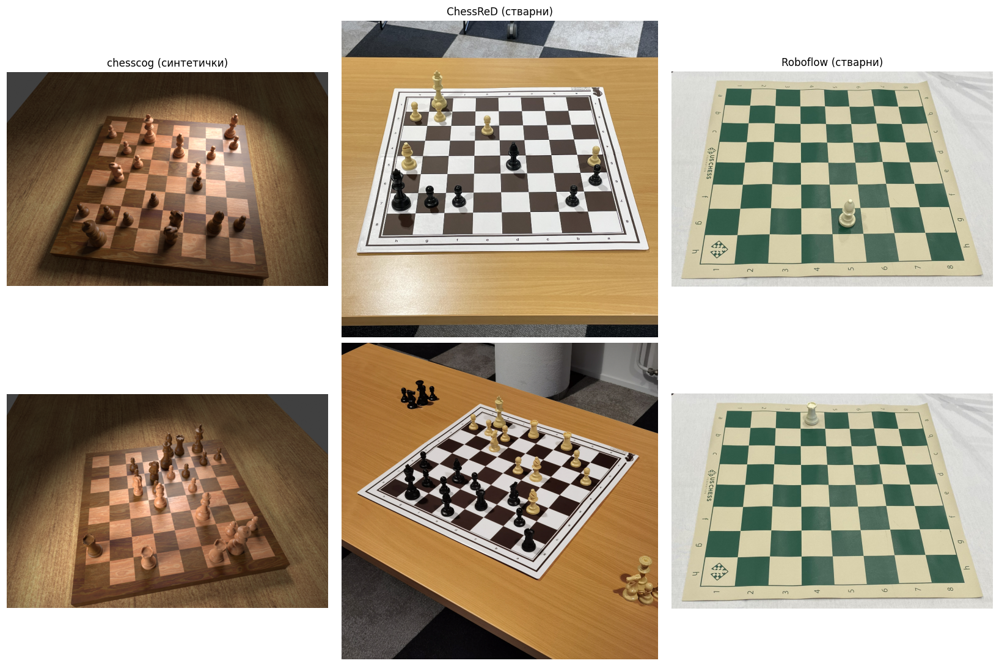

In [ ]:
random.seed(7)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

cc = [r for r in CC_RECORDS if r.get('split') == 'test']
for i, rec in enumerate(random.sample(cc, 2)):
    img = cv2.imread(str(CC_ROOT / rec['path']))
    axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if i == 0: axes[i, 0].set_title('chesscog (синтетички)')
    axes[i, 0].axis('off')

for i, iid in enumerate(random.sample(sorted(CR_CORNERS), 2)):
    img = cv2.resize(cv2.imread(str(cr_path(iid))), (768, 768))
    axes[i, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if i == 0: axes[i, 1].set_title('ChessReD (стварни)')
    axes[i, 1].axis('off')

rb = sorted(Path('/content/Roboflow/test/images').glob('*.jpg'))
for i, p in enumerate(random.sample(rb, 2)):
    img = cv2.imread(str(p))
    axes[i, 2].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if i == 0: axes[i, 2].set_title('Roboflow (стварни)')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.savefig('/content/slike/primeri_skupova.png')
plt.show()

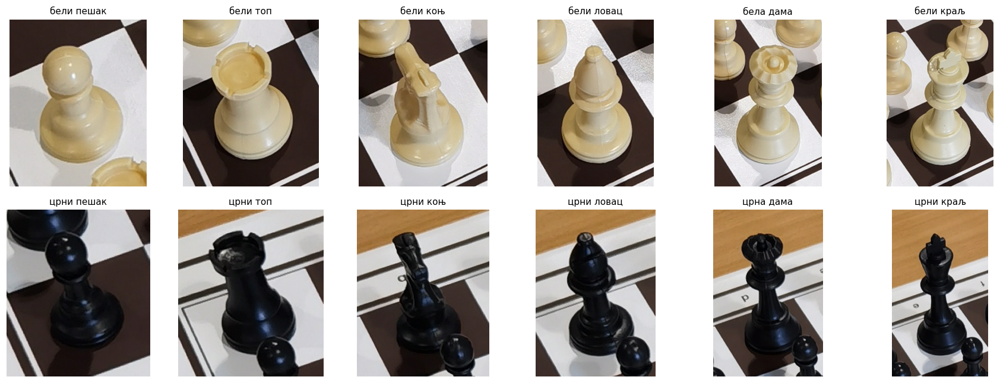

In [ ]:
NAMES_SR = {0:'бели пешак',1:'бели топ',2:'бели коњ',3:'бели ловац',
            4:'бела дама',5:'бели краљ',6:'црни пешак',7:'црни топ',
            8:'црни коњ',9:'црни ловац',10:'црна дама',11:'црни краљ'}

pieces_by_cat = {}
for p in CR_RAW['annotations']['pieces']:
    cat = p['category_id']
    if cat == 12 or cat in pieces_by_cat:
        continue
    if p['image_id'] not in CR_CORNERS:
        continue
    if p['bbox'][2] < 120 or p['bbox'][3] < 150:
        continue
    pieces_by_cat[cat] = p
    if len(pieces_by_cat) == 12:
        break

fig, axes = plt.subplots(2, 6, figsize=(16, 6))
for cat in range(12):
    ax = axes[cat // 6, cat % 6]
    p = pieces_by_cat.get(cat)
    if p is None:
        ax.axis('off'); continue
    img = cv2.imread(str(cr_path(p['image_id'])))
    x, y, w, h = [int(v) for v in p['bbox']]
    pad = int(0.15 * max(w, h))
    crop = img[max(0,y-pad):y+h+pad, max(0,x-pad):x+w+pad]
    ax.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    ax.set_title(NAMES_SR[cat], fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig('/content/slike/predstavnici_klasa.png')
plt.show()

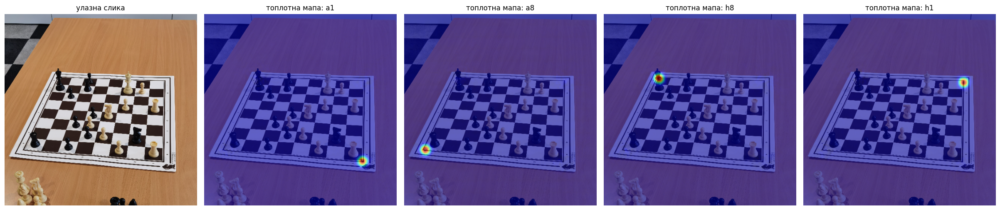

In [ ]:
import sys; sys.path.insert(0, '/content')
from torchvision import transforms
from assign_to_board import HeatmapNet

IMNET = ([0.485,0.456,0.406],[0.229,0.224,0.225])
model = HeatmapNet().to(DEVICE)
model.load_state_dict(torch.load(CORNER_CR, map_location=DEVICE))
model.eval()
tf = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor(),
                         transforms.Normalize(*IMNET)])

iid = sorted(CR_CORNERS)[50]
img = cv2.imread(str(cr_path(iid)))
pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
with torch.inference_mode():
    hm = model(tf(pil).unsqueeze(0).to(DEVICE))[0].cpu().numpy()

names = ['a1', 'a8', 'h8', 'h1']
small = cv2.resize(img, (512, 512))

fig, axes = plt.subplots(1, 5, figsize=(22, 5))
axes[0].imshow(cv2.cvtColor(small, cv2.COLOR_BGR2RGB))
axes[0].set_title('улазна слика'); axes[0].axis('off')
for k in range(4):
    axes[k+1].imshow(cv2.cvtColor(small, cv2.COLOR_BGR2RGB))
    axes[k+1].imshow(cv2.resize(hm[k], (512,512)), cmap='jet', alpha=0.55)
    axes[k+1].set_title(f'топлотна мапа: {names[k]}')
    axes[k+1].axis('off')

plt.tight_layout()
plt.savefig('/content/slike/toplotne_mape.png')
plt.show()

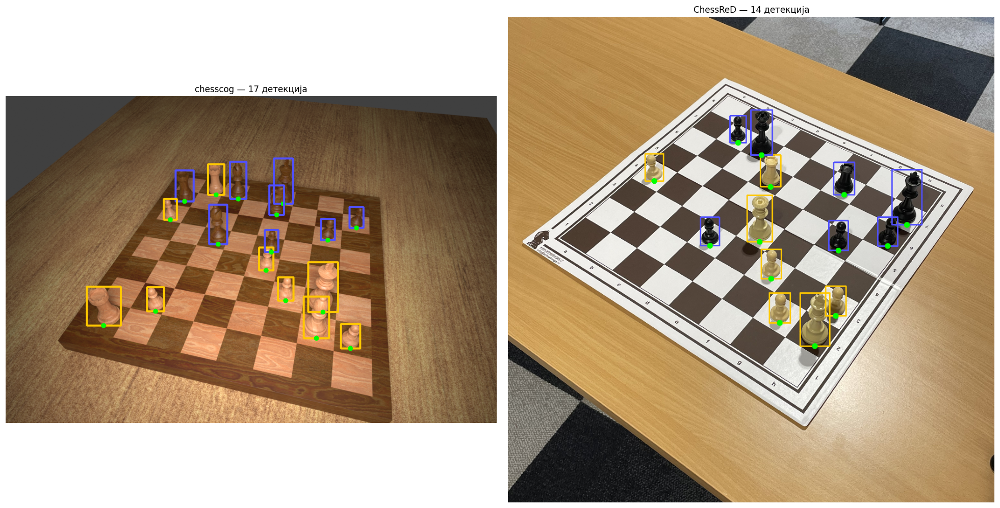

In [ ]:
from ultralytics import YOLO
model = YOLO(YOLO_W)
random.seed(3)

def draw(img, res, th=4, rad=9):
    out = img.copy()
    for b, c in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.cls.cpu().numpy()):
        x1, y1, x2, y2 = [int(v) for v in b]
        col = (0,200,255) if int(c) < 6 else (255,80,80)
        cv2.rectangle(out, (x1,y1), (x2,y2), col, th)
        cv2.circle(out, ((x1+x2)//2, y2), rad, (0,255,0), -1)
    return out

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

rec = random.choice([r for r in CC_RECORDS if r.get('split')=='test'])
img = cv2.imread(str(CC_ROOT / rec['path']))
res = model.predict(img, conf=0.25, verbose=False)[0]
axes[0].imshow(cv2.cvtColor(draw(img, res, 3, 6), cv2.COLOR_BGR2RGB))
axes[0].set_title(f'chesscog — {len(res.boxes)} детекција'); axes[0].axis('off')

iid = random.choice(sorted(CR_CORNERS))
img2 = cv2.imread(str(cr_path(iid)))
res2 = model.predict(img2, conf=0.25, verbose=False)[0]
axes[1].imshow(cv2.cvtColor(cv2.resize(draw(img2,res2,8,18),(1024,1024)), cv2.COLOR_BGR2RGB))
axes[1].set_title(f'ChessReD — {len(res2.boxes)} детекција'); axes[1].axis('off')

plt.tight_layout()
plt.savefig('/content/slike/yolo_detekcije.png')
plt.show()

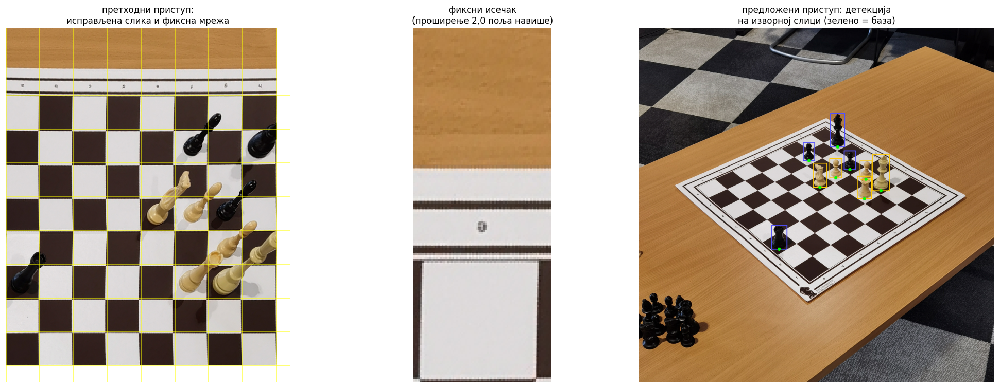

In [ ]:
from ultralytics import YOLO
model = YOLO(YOLO_W)

iid = sorted(CR_CORNERS)[200]
img = cv2.imread(str(cr_path(iid)))
cd = CR_CORNERS[iid]
src = np.array([cd['bottom_left'], cd['top_left'],
                cd['top_right'], cd['bottom_right']], dtype=np.float32)

SIZE, HEAD = 512, 128
dst = np.array([[0,HEAD+SIZE],[0,HEAD],[SIZE,HEAD],[SIZE,HEAD+SIZE]], dtype=np.float32)
H = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(img, H, (SIZE, SIZE+HEAD))
cell = SIZE // 8

fig, axes = plt.subplots(1, 3, figsize=(19, 7))

axes[0].imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
for k in range(9):
    axes[0].axhline(HEAD + k*cell, color='yellow', lw=1, alpha=0.7)
    axes[0].axvline(k*cell, color='yellow', lw=1, alpha=0.7)
axes[0].set_title('претходни приступ:\nисправљена слика и фиксна мрежа')
axes[0].axis('off')

r, c = 0, 4
y1 = int(HEAD + r*cell - 2.0*cell); y2 = int(HEAD + (r+1)*cell + 0.1*cell)
x1 = int(c*cell - 0.1*cell); x2 = int((c+1)*cell + 0.1*cell)
axes[1].imshow(cv2.cvtColor(warped[max(0,y1):y2, max(0,x1):x2], cv2.COLOR_BGR2RGB))
axes[1].set_title('фиксни исечак\n(проширење 2,0 поља навише)')
axes[1].axis('off')

res = model.predict(img, conf=0.25, verbose=False)[0]
vis = img.copy()
for b, cl in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.cls.cpu().numpy()):
    x1b,y1b,x2b,y2b = [int(v) for v in b]
    col = (0,200,255) if int(cl) < 6 else (255,80,80)
    cv2.rectangle(vis, (x1b,y1b), (x2b,y2b), col, 6)
    cv2.circle(vis, ((x1b+x2b)//2, y2b), 14, (0,255,0), -1)
axes[2].imshow(cv2.cvtColor(cv2.resize(vis,(900,900)), cv2.COLOR_BGR2RGB))
axes[2].set_title('предложени приступ: детекција\nна изворној слици (зелено = база)')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('/content/slike/isecanje_vs_detekcija.png')
plt.show()

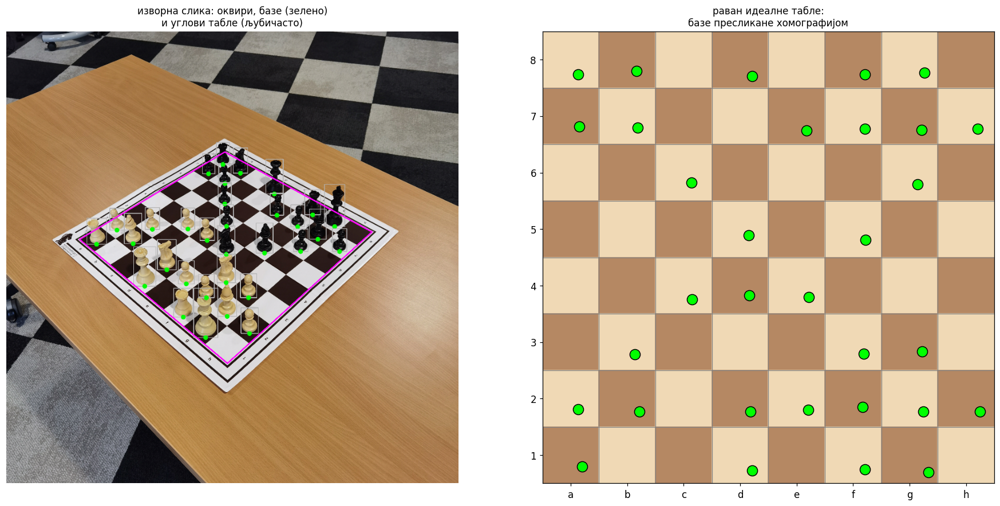

In [ ]:
from ultralytics import YOLO
model = YOLO(YOLO_W)

iid = sorted(CR_CORNERS)[120]
img = cv2.imread(str(cr_path(iid)))
cd = CR_CORNERS[iid]
src = np.array([cd['bottom_left'], cd['top_left'],
                cd['top_right'], cd['bottom_right']], dtype=np.float32)
S = 800
H = cv2.getPerspectiveTransform(src, np.array([[0,S],[0,0],[S,0],[S,S]], dtype=np.float32))

res = model.predict(img, conf=0.25, verbose=False)[0]
boxes = res.boxes.xyxy.cpu().numpy()
base = np.array([[[(b[0]+b[2])/2, b[3]]] for b in boxes], dtype=np.float32)
tp = cv2.perspectiveTransform(base, H)[:,0,:]

fig, axes = plt.subplots(1, 2, figsize=(17, 8))

vis = img.copy()
for b in boxes:
    x1,y1,x2,y2 = [int(v) for v in b]
    cv2.rectangle(vis, (x1,y1), (x2,y2), (180,180,180), 4)
    cv2.circle(vis, ((x1+x2)//2, y2), 16, (0,255,0), -1)
cv2.polylines(vis, [src.astype(int).reshape(-1,1,2)], True, (255,0,255), 8)
axes[0].imshow(cv2.cvtColor(cv2.resize(vis,(900,900)), cv2.COLOR_BGR2RGB))
axes[0].set_title('изворна слика: оквири, базе (зелено)\nи углови табле (љубичасто)')
axes[0].axis('off')

axes[1].set_xlim(0,S); axes[1].set_ylim(S,0); axes[1].set_aspect('equal')
for i in range(8):
    for j in range(8):
        col = '#f0d9b5' if (i+j)%2==0 else '#b58863'
        axes[1].add_patch(plt.Rectangle((j*S/8, i*S/8), S/8, S/8, color=col))
axes[1].scatter(tp[:,0], tp[:,1], c='lime', s=140, edgecolors='black', zorder=5)
for k in range(9):
    axes[1].axhline(k*S/8, color='gray', lw=0.8)
    axes[1].axvline(k*S/8, color='gray', lw=0.8)
axes[1].set_xticks([(j+0.5)*S/8 for j in range(8)]); axes[1].set_xticklabels(list('abcdefgh'))
axes[1].set_yticks([(i+0.5)*S/8 for i in range(8)]); axes[1].set_yticklabels(list('87654321'))
axes[1].set_title('раван идеалне табле:\nбазе пресликане хомографијом')

plt.tight_layout()
plt.savefig('/content/slike/dodela_polju.png')
plt.show()

Corner model učitan: /content/models/corner_heatmap_chessred.pth (img_size=256)
Corner model učitan: /content/corner_heatmap.pth (img_size=256)


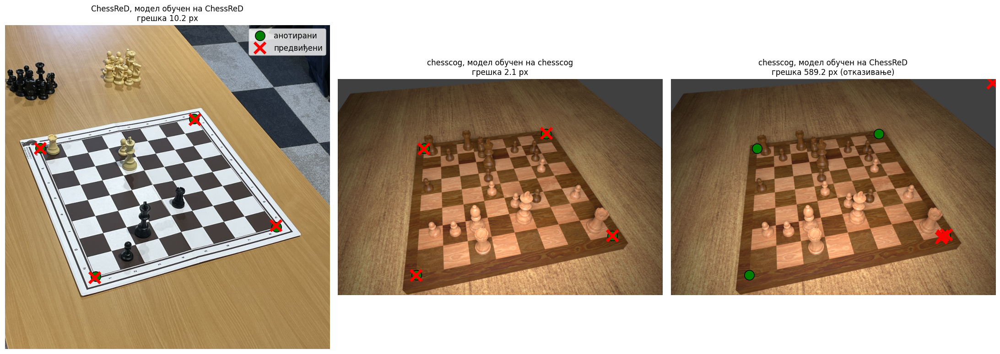

In [ ]:
import sys; sys.path.insert(0, '/content')
from assign_to_board import CornerPredictor

random.seed(5)
cp_cr = CornerPredictor(CORNER_CR, DEVICE)
cp_cc = CornerPredictor(CORNER_CC, DEVICE)

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

iid = random.choice(sorted(CR_CORNERS))
img = cv2.imread(str(cr_path(iid)))
cd = CR_CORNERS[iid]
true = np.array([cd['bottom_left'],cd['top_left'],cd['top_right'],cd['bottom_right']])
pred = cp_cr.predict(img)
sc = 900 / img.shape[0]
axes[0].imshow(cv2.cvtColor(cv2.resize(img,(900,900)), cv2.COLOR_BGR2RGB))
axes[0].plot(true[:,0]*sc, true[:,1]*sc, 'go', ms=14, mec='k', label='анотирани')
axes[0].plot(pred[:,0]*sc, pred[:,1]*sc, 'rx', ms=16, mew=4, label='предвиђени')
axes[0].set_title(f'ChessReD, модел обучен на ChessReD\nгрешка {np.sqrt(((pred-true)**2).sum(1)).mean():.1f} px')
axes[0].legend(); axes[0].axis('off')

rec = random.choice([r for r in CC_RECORDS if r.get('split')=='test'])
img2 = cv2.imread(str(CC_ROOT / rec['path']))
true2 = np.array(rec['corners'], dtype=np.float32)
pred2 = cp_cc.predict(img2)
axes[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
axes[1].plot(true2[:,0], true2[:,1], 'go', ms=14, mec='k')
axes[1].plot(pred2[:,0], pred2[:,1], 'rx', ms=16, mew=4)
axes[1].set_title(f'chesscog, модел обучен на chesscog\nгрешка {np.sqrt(((pred2-true2)**2).sum(1)).mean():.1f} px')
axes[1].axis('off')

pred3 = cp_cr.predict(img2)
axes[2].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
axes[2].plot(true2[:,0], true2[:,1], 'go', ms=14, mec='k')
axes[2].plot(pred3[:,0], pred3[:,1], 'rx', ms=16, mew=4)
axes[2].set_title(f'chesscog, модел обучен на ChessReD\nгрешка {np.sqrt(((pred3-true2)**2).sum(1)).mean():.1f} px (отказивање)')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('/content/slike/uglovi_poredjenje.png')
plt.show()